# Explore signal/price movement relationship

This is an example notebook to explore whether a trading signal results to profitable trades.

- 3 days 
- It explores a small set of pairs on Uni v3 on Polygon
- Both long and short are considered (though shorts might be theoretical only, if such a lending market doest not exist in the point of time)

First run to prepare the dataset:

```shell
python scripts/prepare-polygon-momentum-candles.py
```

In [154]:
import pandas as pd

from tradingstrategy.client import Client
from tradingstrategy.chain import ChainId
from tradingstrategy.pair import PandasPairUniverse
from tradingstrategy.timebucket import TimeBucket
from tradeexecutor.utils.default_strategies import get_default_strategies_path
from tradeexecutor.strategy.execution_context import notebook_execution_context
from tradeexecutor.utils.default_strategies import get_default_strategies_path
from tradeexecutor.strategy.strategy_module import read_strategy_module
from tradeexecutor.strategy.trading_strategy_universe import TradingStrategyUniverse, load_partial_data, load_trading_and_lending_data
from tradeexecutor.strategy.universe_model import UniverseOptions

client = Client.create_jupyter_client()

# Load preprocessed candle dataset
# See fetch-binance-candles.py   
time_bucket = TimeBucket.d1
fpath = f"/tmp/binance-candles-{time_bucket.value}.parquet"
all_candles_df = pd.read_parquet(fpath)
pair_ids = all_candles_df["pair_id"].unique()


Started Trading Strategy in Jupyter notebook environment, configuration is stored in /Users/moo/.tradingstrategy


### Interactive viewer mode

Set Plotly chart output mode to interactive viewing.

In [155]:
from tradeexecutor.utils.notebook import OutputMode, setup_charting_and_output

setup_charting_and_output(OutputMode.interactive, max_rows=35, height=1000)
# setup_charting_and_output(
#     OutputMode.static, 
#     image_format="png",
#     width=1500,
#     height=1200,
#     max_rows=30,    
#     #min_rows=10,
# )

#pd.set_option('display.float_format', lambda x: '%.2f' % x)
pd.options.display.float_format = '{:,.2f}'.format


## Filter trading pairs

In [156]:
from tradingstrategy.pair import filter_for_stablecoins, StablecoinFilteringMode

candles_df = all_candles_df

print(f"We have {len(pair_ids)} tradeable pairs")
print(f"We have {len(candles_df):,} candles for tradeable pairs, out of {len(all_candles_df):,} total candles")


We have 12 tradeable pairs
We have 18,443 candles for tradeable pairs, out of 18,443 total candles


## Explore signal vs price change

Create a function `calculate_signal_vs_profit` which calculates 
- Signal (naive momentum)
- Profit: the last and the best future price we can get
- Allows us to play around with different time windows
- Split between shorts and longs


In [157]:
from pandas.tseries.frequencies import to_offset
import humanize

# Set up parameters of time windows
# we use for this notebook run
#lookback_window = pd.Timedelta(days=2)
#profit_window = pd.Timedelta(days=2)


lookback_window = pd.Timedelta(hours=24)
profit_window = pd.Timedelta(days=7)

long_lookback_window = lookback_window * 4
daily_volume_threshold = 10_000

# short - long EMA pairs
short_long_ema_pairs = [
    (8, 24),
    (16, 48),
    # (32, 96),
]

# Normalise EMA diff to 90 days/90 hours
ema_diff_short_normalisation_period = 63
ema_diff_long_normalisation_period =  252

min_entries = 14

min_age = pd.DateOffset(days=20)

quantile_sanity_threshold = 0.9995


# Use later in chart titles
signal_window_label = humanize.naturaldelta(lookback_window)
profit_window_label = humanize.naturaldelta(profit_window)


Create a function `calculate_signal_vs_price_for_pair` which calculates 
- Calculates the signal vs. for certain trading pair
- Bundle few different pairs to the same `DataFrame` so we can examine them together


In [158]:
from math import e, sqrt
import numpy as np
from pandas.core.groupby import DataFrameGroupBy
from pandas_ta import ema, pvt, obv


def calculate_ema_signal(df: pd.DataFrame):
    """Calculate different EMA, their diffs as a single signal

    The signal is based on the idea that when short moving average or price
    is moving faster than the long moving average of the price,
    the asset has momentu.

    - We calculate three different long EMA and short EMA differences
    - We normalise these difference over the price development of some duration
    - Each normalised difference is mapped to -1 ... 1
    - Signal is equally weighted sum of all SMA diffs

    Sources:

    - Momentum and trend following trading strategies for currencies and bitcoin
      by Janick Rohrbach, Silvan Suremann, Joerg Osterriede]

    - Dissecting Investment Strategies in the Cross Section and Time Series
      by Jamil Baza, Nick Grangerb, Campbell R. Harveyc, Nicolas Le Rouxd and Sandy Rattraye

    :return:
        DataFrame with added columns.

        Columns: signal, ema_signal_1, ema_long_1, ema_short_1, ema_diff_1...
        
    """

    # Did we manage to calculate all long/short EMA pairs for this pair
    # or is the data duration too short / not enough data
    enough_data = True

    for idx, ema_tuple in enumerate(short_long_ema_pairs, start=1):
        short_ema, long_ema = ema_tuple
        df[f"ema_long_{idx}"] = ema(df["close"], length=long_ema) 
        df[f"ema_short_{idx}"] = ema(df["close"], length=short_ema)
        df[f"ema_diff_{idx}"] = df[f"ema_short_{idx}"] - df[f"ema_long_{idx}"]

        # Normalise EMA diff with 90 candles moving standard deviation        
        df[f"ema_diff_normalised_{idx}"] = df[f"ema_diff_{idx}"] / df[f"ema_diff_{idx}"].rolling(ema_diff_short_normalisation_period).std()
        # Normalise the normalised EMA diff with 280 candles moving standard deviation
        df[f"ema_diff_double_normalised_{idx}"] = df[f"ema_diff_normalised_{idx}"] / df[f"ema_diff_normalised_{idx}"].rolling(ema_diff_long_normalisation_period).std()

        # x exp(-x^2 / 4)
        # 0.858

        # x = df[f"ema_diff_double_normalised_{idx}"]
        # denominator = sqrt(2) * e**(-0.5)
        # exponent = (x**2) / -4

        # if not pd.isnull(exponent).all():
        #     exponented = np.exp(exponent)
        #     df[f"ema_signal_{idx}"] = df[f"ema_diff_double_normalised_{idx}"] * exponented / denominator
        # else:
        #     # Could not calculate any of the exponents because all values in the series are NaN
        #     enough_data = False
        #     break

        df[f"ema_signal_{idx}"] = df[f"ema_diff_double_normalised_{idx}"]

    if enough_data:
        # We could calculate partial results for all EMA pairs
        df["signal"] = 0
        for idx, ema_tuple in enumerate(short_long_ema_pairs, start=1):
            df["signal"] += df[f"ema_signal_{idx}"] 
        df["signal"] = df["signal"] / len(ema_tuple)
    else:
        df["signal"] = 0

    return df    


def calculate_signal_vs_profit(
    df: pd.DataFrame, 
    pair_id: str,
    momentum_window: pd.Timedelta, 
    profit_window: pd.Timedelta,
    time_frame: pd.Timedelta,        
) -> pd.DataFrame:
    """Calculate signals and profits for all incoming candles."""

    number_of_look_back_candles = lookback_window / time_frame
    number_of_look_forward_candles = profit_window / time_frame
    assert number_of_look_forward_candles > 0 and number_of_look_forward_candles.is_integer(), f"Could not calculate candle count that fits into profit window {profit_window} for data time frame {time_frame}"
    assert number_of_look_back_candles > 0 and number_of_look_forward_candles.is_integer(), f"Could not calculate candle count that fits into profit window {lookback_window} for data time frame {time_frame}"
    number_of_look_forward_candles = int(number_of_look_forward_candles)
    number_of_look_back_candles = int(number_of_look_back_candles)

    # Create entries for past price to be used for signal
    # and future price (used for the price correlation)
    momentum_offset = to_offset(lookback_window)
    profit_offset = to_offset(profit_window)

    # No data left after filtering
    if len(df.index) == 0:
        return pd.DataFrame()

    # Calculate trading pair age in a column
    start = df.index[0]

    # Remove first N days of trading history to filter out scam pump and dumps
    df = df.loc[df.index > start + min_age].copy()

    # No data left after filtering
    if len(df) < number_of_look_back_candles:
        return pd.DataFrame()
    
    df["age"] = df.index - start

    # Fix missing prices
    df["open"] = df["open"].replace(0, np.NaN)

    df["prev"] = df["open"].shift(number_of_look_back_candles)
    df["next"] = df["open"].shift(-number_of_look_forward_candles)

    # What is our predicted price
    df["price_diff"] = (df["next"] - df["open"]) / df["open"]  # Get the profit on the final day of profit window

    # Calculate signal from the past and price difference to the future
    df["momentum"] = (df["prev"] - df["open"]) / df["open"]

    #df["shifted_close"] = df["volume"].shift(1).rolling(obv_len).sum()
    #shifted_close = df.rolling(obv_len)
    #assert shifted_close["close"] is not None
    #assert shifted_close["volume"] is not None
    #import ipdb ; ipdb.set_trace()
    df["pvt"] = pvt(df["close"], df["volume"])
    df["obv"] = obv(df["close"], df["volume"])

    df = calculate_ema_signal(df)

    #df["obv"] = obv(shifted_close["close"], shifted_close["volume"])
    #shifted = shifted.iloc[-obv_len:-1]
    # df["obv"] = obv(shifted["close"], shifted["volume"])

    # Drop any momentum value that seems to be incorrect (more than 99% price movement)
    df["momentum"] = np.where(df["momentum"] > 0.99, 0, df["momentum"])
    df["momentum"] = np.where(df["momentum"] < -0.99, 0, df["momentum"])
    
    # df.loc[df["bullish"] & (df["momentum"] >= 0), "signal"] = df["momentum"]
    # df.loc[df["bearish"] & (df["momentum"] < 0), "signal"] = df["momentum"]    
    df["rolling_cum_volume"] = df["volume"].rolling(window=long_lookback_window).sum() 
    df["rolling_obv"] = df["obv"] - df["obv"].shift(periods=number_of_look_back_candles)
    df["rolling_pvt"] = df["pvt"] - df["pvt"].shift(periods=number_of_look_back_candles)
    # df["signal"] = df["rolling_pvt"].shift(1) / df["rolling_cum_volume"].shift(1)
    #df["signal"] = df["rolling_obv"].shift(1) / df["rolling_cum_volume"].shift(1)

    # df["signal"] = df["momentum"]
    
    # On negative signals, we go short.
    # On zero signal and lack of data set side to NA
    df["side"] = pd.NA
    
    df.loc[df["signal"] > 0, "side"] = "long"
    df.loc[df["signal"] < 0, "side"] = "short"

    # Max and min price wihtin the profit window will determine the profit for longs and shorts respective
    df["max_future_price"] = df["close"].rolling(number_of_look_forward_candles).max().shift(-number_of_look_forward_candles) # Get the max profit on the profit window, assuming take profit %
    df["min_future_price"] = df["close"].rolling(number_of_look_forward_candles).min().shift(-number_of_look_forward_candles) # Get the max profit on the profit window, assuming take profit %    
    
    df["profit"] = df["price_diff"]
    df["profit_max"] = df["profit"]
    df["profit_abs"] = df["profit_max"].abs()
    # Calculate profit separately for longs and shorts
    # using Pandas Mask
    # https://stackoverflow.com/a/33770421/315168
    #
    # We calculate both profit after X time,
    # and also max take profit, assuming
    # we could do a perfect trailing stop loss
    #
    #longs = (df["side"] == "long")
    #shorts = (df["side"] == "short")
    #df.loc[longs, "profit"] = df["price_diff"]
    #df.loc[shorts, "profit"] = -df["price_diff"]
    #df.loc[longs, "profit_max"] = (df["max_future_price"] - df["open"]) / df["open"]  # Get the profit based on max price
    #df.loc[shorts, "profit_max"] = -(df["min_future_price"] - df["open"]) / df["open"]  # Get the profit based on max price

    #df.loc[longs, "desc"] = df.agg('{0[ticker]} long'.format, axis=1)
    #df.loc[shorts, "desc"] = df.agg('{0[ticker]} short'.format, axis=1)

    df["profit"] = df["profit"].fillna(0)
    df["profit_max"] = df["profit_max"].fillna(0)

    # On too low trading volume we zero out signal
    candle_volume_threshold = daily_volume_threshold * (time_frame / pd.Timedelta(days=1))
    volume_threshold_exceeded = df["volume"] >= candle_volume_threshold
    df["signal"] = np.where(volume_threshold_exceeded, df["signal"], np.NaN)
    df["profit"] = np.where(volume_threshold_exceeded, df["profit"], np.NaN)
    df["profit_max"] = np.where(volume_threshold_exceeded, df["profit_max"], np.NaN)
    
    return df


def calculate_signal_vs_price_for_pair(
    grouped_candles: DataFrameGroupBy,
    pair_id: str
) -> pd.DataFrame:
    """Calculate signal vs. profit ratio for an individual pair."""
    try:
        df = grouped_candles.get_group(pair_id).copy()
    except KeyError:
        # Scam pairs 
        return pd.DataFrame()
        
    df = calculate_signal_vs_profit(
        df,
        pair_id,
        lookback_window,
        profit_window,
        time_frame=time_bucket.to_pandas_timedelta(),
    )
    return df

print("Calculating signals")
grouped_candles = candles_df.groupby("pair_id")
per_pair_data = [calculate_signal_vs_price_for_pair(grouped_candles, pair) for pair in pair_ids]

valid_pairs = []
zero_signal_cut_off = 0.0001
zero_signal_pairs = 0
for pair_data_df in per_pair_data:
    if not pair_data_df.empty and (pair_data_df["signal"].abs() >= zero_signal_cut_off).any():
        valid_pairs.append(pair_data_df)        
    else:
        zero_signal_pairs += 1
        

print(f"Pairs with valid signal data {len(valid_pairs):,}")
print(f"Pairs with zero signal: {zero_signal_pairs:,}")

df = pd.concat(valid_pairs)    

# Fix column order for table rendering
df.insert(0, 'signal', df.pop('signal'))
df.insert(0, 'profit', df.pop('profit'))

print(f"Total signal samples {len(df):,}")



Calculating signals
Pairs with valid signal data 12
Pairs with zero signal: 0
Total signal samples 18,191


### Display sample content for single trading pair

In [159]:
# Display sample content for one pair
# Pick single pair to examine
# The first pair is ETH-USD
#examined_pair = pair_universe.get_pair_by_human_description((ChainId.polygon, "uniswap-v3", "WMATIC", "USDC", 0.0005))
examined_pair = "BTCUSDT"
single_df = df.loc[df["pair_id"] == examined_pair]

with pd.option_context('display.min_rows', 10), pd.option_context('display.max_rows', 10):
    display(single_df)


,profit,signal,open,high,low,close,volume,pair_id,age,prev,...,ema_diff_double_normalised_2,ema_signal_2,rolling_cum_volume,rolling_obv,rolling_pvt,side,max_future_price,min_future_price,profit_max,profit_abs
timestamp,,,,,,,,,,,,,,,,,,,,,
2017-09-07,NaN,NaN,"4,619.77","4,788.59","4,438.19","4,691.61",500.43,BTCUSDT,21 days,NaN,...,NaN,NaN,500.43,NaN,NaN,NaN,"4,282.80","3,189.02",NaN,0.15
2017-09-08,NaN,NaN,"4,691.66","4,735.39","4,028.93","4,282.80","1,132.26",BTCUSDT,22 days,"4,619.77",...,NaN,NaN,"1,632.69","-1,132.26",NaN,NaN,"4,258.81","3,189.02",NaN,0.32
2017-09-09,NaN,NaN,"4,282.80","4,426.62","4,150.06","4,258.81",658.78,BTCUSDT,23 days,"4,691.66",...,NaN,NaN,"2,291.47",-658.78,-369.02,NaN,"4,208.47","3,189.02",NaN,0.14
2017-09-10,NaN,NaN,"4,258.81","4,283.00","3,801.00","4,130.37",660.37,BTCUSDT,24 days,"4,282.80",...,NaN,NaN,"2,951.84",-660.37,"-1,991.60",NaN,"4,208.47","3,189.02",NaN,0.13
2017-09-11,NaN,NaN,"4,153.62","4,334.43","4,098.91","4,208.47",699.99,BTCUSDT,25 days,"4,258.81",...,NaN,NaN,"3,151.40",699.99,"1,323.59",NaN,"4,163.72","3,189.02",NaN,0.11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-20,0.00,1.28,"37,359.85","37,750.00","36,677.00","37,448.78","36,022.70",BTCUSDT,2286 days,"36,568.11",...,1.39,1.39,"112,654.90","36,022.70","8,573.74",long,NaN,NaN,0.00,NaN
2023-11-21,0.00,1.13,"37,448.79","37,649.44","35,735.00","35,741.65","47,646.55",BTCUSDT,2287 days,"37,359.85",...,1.32,1.32,"122,017.84","-47,646.55","-217,200.27",long,NaN,NaN,0.00,NaN
2023-11-22,0.00,1.14,"35,741.65","37,861.10","35,632.01","37,408.34","45,051.31",BTCUSDT,2288 days,"37,448.79",...,1.31,1.31,"149,966.90","45,051.31","210,081.41",long,NaN,NaN,0.00,NaN


### Outlier filter

Get rid of abnormally large values caused on scam tokens and other issues in the input data.

In [160]:
# Store for later
unfiltered_df = df

# Run outlier filter
#
# Use separate quantile for high and low because low min is -1.0 lose your all money when the token goes to zero in rug pull
#
# https://stackoverflow.com/questions/23199796/detect-and-exclude-outliers-in-a-pandas-dataframe
q_hi  = df["profit"].quantile(quantile_sanity_threshold)
q_low = df["profit"].quantile(1 - quantile_sanity_threshold)

#q_low = df["profit_max"].quantile(0.01)
#q_hi  = df["profit_max"].quantile(0.99)
# df = df[(df["profit"] < q_hi) & (df["profit"] > q_low)]

df = df

print(f"Max profit high filtering {quantile_sanity_threshold}, quantile high is {q_hi},  quantile low is {q_low}")
#df = df[df["profit_abs"] < q_hi]

q_hi  = df["signal"].abs().quantile(quantile_sanity_threshold)
#q_low = df["profit_max"].quantile(0.01)
#q_hi  = df["profit_max"].quantile(0.99)
#df_filtered = df[(df["profit_max"] < q_hi) & (df["profit_max"] > q_low)]

#print(f"Max signal high filtering {quantile_sanity_threshold} quantile is {q_hi}")
#df = df[df["signal"].abs() < q_hi]

#price_df = df.sort_values('price_diff', ascending=False).drop_duplicates("timestamp")
#display(price_df)

Max profit high filtering 0.9995, quantile high is 1.4963423074089677,  quantile low is -0.5747993292169681


### Best signal picker


In [161]:
# Find maximum momentum df
profit_df = df.copy()
#profit_df.index = pd.MultiIndex.from_arrays([df.index, df["pair"]])
profit_df["signal"] = profit_df["signal"].fillna(0).replace([np.inf, -np.inf], 0)
profit_df["profit"] = profit_df["profit"].fillna(0).replace([np.inf, -np.inf], 0)
profit_df["profit_max"] = profit_df["profit_max"].fillna(0).replace([np.inf, -np.inf], 0)
profit_df["timestamp"] = profit_df.index
#display(profit_df)

#max_df = df.loc[df.groupby("timestamp")['signal'].idxmax()]
# max_df = df.groupby("timestamp")["profit"].max()
max_df = profit_df.sort_values('signal', key=abs, ascending=False).drop_duplicates("timestamp")
# max_df["signal"] = profit_df["signal"].fillna(0)

max_df = max_df.sort_values("signal", ascending=False)
print(f"Best picked results {len(max_df):,}")
# display(max_df)

#quantile_sanity_threshold = 0.90
#q_hi  = max_df["profit_abs"].quantile(quantile_sanity_threshold)
#print(f"Best profit high filtering {quantile_sanity_threshold} quantile is {q_hi}")
#max_df = max_df[max_df["profit_abs"] < q_hi]
#q_hi  = max_df["signal"].abs().quantile(quantile_sanity_threshold)
#print(f"Best signal high filtering {quantile_sanity_threshold} quantile is {q_hi}")
#max_df = max_df[max_df["signal"].abs() < q_hi]
#print(f"Best picked results, filtered {len(max_df):,}")

display(max_df)

Best picked results 2,270


,profit,signal,open,high,low,close,volume,pair_id,age,prev,...,ema_signal_2,rolling_cum_volume,rolling_obv,rolling_pvt,side,max_future_price,min_future_price,profit_max,profit_abs,timestamp
timestamp,,,,,,,,,,,,,,,,,,,,,
2021-01-05,0.04,4.59,"1,041.45","1,134.60",974.45,"1,099.56","2,706,995.68",ETHUSDT,1237 days,978.33,...,4.56,"11,118,229.08","2,706,995.68","15,109,768.17",long,"1,276.00","1,050.16",0.04,0.04,2021-01-05
2021-01-04,0.28,4.56,978.33,"1,162.97",890.00,"1,041.43","4,245,010.94",ETHUSDT,1236 days,774.44,...,4.37,"9,086,347.50","4,245,010.94","27,402,424.75",long,"1,276.00","1,087.01",0.28,0.28,2021-01-04
2021-10-25,0.26,4.53,3.50,4.84,3.48,4.80,"56,251,204.13",CRVUSDT,436 days,3.69,...,4.28,"131,282,168.94","56,251,204.13","2,081,712,180.33",long,4.76,4.42,0.26,0.26,2021-10-25
2020-07-08,0.42,4.51,5.72,6.58,5.59,6.50,"16,816,910.79",LINKUSDT,539 days,5.36,...,4.69,"46,286,865.93","16,816,910.79","227,337,326.38",long,8.65,6.08,0.42,0.42,2020-07-08
2021-01-06,-0.05,4.50,"1,100.16","1,213.00","1,057.26","1,208.42","2,390,136.59",ETHUSDT,1238 days,"1,041.45",...,4.60,"12,155,747.09","2,390,136.59","23,663,126.12",long,"1,276.00","1,050.16",-0.05,0.05,2021-01-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-11-18,-0.30,-4.89,"5,630.49","5,738.17","5,617.00","5,662.00","23,845.00",BTCUSDT,458 days,"5,650.57",...,-5.06,"136,678.87","23,845.00","14,281.69",short,"4,910.03","3,932.44",-0.30,0.30,2018-11-18
2018-11-21,-0.15,-4.89,"4,559.91","4,787.20","4,413.85","4,661.07","61,071.83",BTCUSDT,461 days,"4,913.40",...,-5.15,"272,878.67","61,071.83","136,923.52",short,"4,420.61","3,862.20",-0.15,0.15,2018-11-21
2018-11-17,-0.22,-5.02,"5,650.57","5,656.60","5,565.43","5,628.29","26,411.24",BTCUSDT,457 days,"5,757.09",...,-4.96,"159,312.84","-26,411.24","-12,911.57",short,"5,662.00","3,932.44",-0.22,0.22,2018-11-17


# Example trading pair chart

Plot with our indicators



In [162]:
import plotly.express as px
import plotly.graph_objects as go

from tradingstrategy.charting.candle_chart import visualise_ohlcv

print(f"Visualising {len(single_df)} candles")

fig = visualise_ohlcv(
    single_df,
    num_detached_indicators=3,
    subplot_names=["Price", "Signal", "Momentum", "PVT"],
)

fig.add_trace(
    go.Scatter(name="Signal", x=single_df.index, y=single_df["signal"]),
    row=2,
    col=1,
)

fig.add_trace(
    go.Scatter(name="Momentum", x=single_df.index, y=single_df["momentum"]),
    row=3,
    col=1,
)
fig.add_trace(
    go.Scatter(name="PVT", x=single_df.index, y=single_df["pvt"]),
    row=4,
    col=1,
)

fig.show()

# display(single_df)

Visualising 2270 candles


## Examine signal

### EMA indicator correlation

See "Table 2: Correlation between the xk" in Momentum and trend following trading strategies for currencies and bitcoin.

In [163]:
diff_df = pd.DataFrame()
for idx in range(len(short_long_ema_pairs)):
    diff_df[f"ema_diff_{idx+1}"] = df[f"ema_diff_{idx+1}"]
    
correlation_matrix = diff_df.corr()
display(correlation_matrix)

,ema_diff_1,ema_diff_2
ema_diff_1,1.00,0.88
ema_diff_2,0.88,1.00


### Signal visualisation

In [164]:
import plotly.express as px
import plotly.graph_objects as go

from tradingstrategy.charting.candle_chart import visualise_ohlcv

fig = visualise_ohlcv(
    single_df,
    num_detached_indicators=3,
    subplot_names=["Price", "Signal", "EMA diffs", "Normalised EMA diffs"],
)

fig.add_trace(
    go.Scatter(name=f"Signal", x=single_df.index, y=single_df[f"signal"]),
    row=2,
    col=1,
)

# Plot all EMA diffs in a single chart
for idx, pair in enumerate(short_long_ema_pairs, start=1):
    short_ema, long_ema = pair
    fig.add_trace(
        go.Scatter(name=f"EMA diff #{idx} short:{short_ema} long:{long_ema}", x=single_df.index, y=single_df[f"ema_diff_{idx}"]),
        row=3,
        col=1,
    )

# Plot all EMA diffs in a single chart
for idx, _ in enumerate(short_long_ema_pairs, start=1):
    fig.add_trace(
        go.Scatter(name=f"Normalised EMA diff #{idx}", x=single_df.index, y=single_df[f"ema_diff_normalised_{idx}"]),
        row=4,
        col=1,
    )


fig.show()


## Signal profitability

Different scatter charts to examine if there is a correlation between the signal and the profit.

### Best signal profitability

- For each time frame, pick the strongest signal

In [165]:

signal_threshold = 0.10

fig = px.scatter(
    max_df, 
    x="signal", 
    y="profit", 
    # trendline="ols", 
    trendline="lowess",
    title=f"Best signal per {signal_window_label}, profit window {profit_window_label}, EMA count {len(short_long_ema_pairs)}",
    trendline_color_override="black",
    trendline_scope="overall",
    color="pair_id",
    #marginal_x="histogram", 
    #marginal_y="rug"    
)
fig.update_layout(legend=dict(title='Pair and direction'))
fig.data = fig.data[::-1]
fig.show()

filtered_max_df = max_df[max_df["signal"].abs() >= signal_threshold]
fig = px.scatter(
    filtered_max_df, 
    x="signal", 
    y="profit", 
    # trendline="ols", 
    trendline="lowess",
    color="pair_id",
    title=f"Best signal per  {signal_window_label}, profit window {profit_window_label}, filtered for {signal_threshold}",
    trendline_color_override="black",
    trendline_scope="overall",
    #marginal_x="histogram", 
    #marginal_y="rug"    
)
fig.update_layout(legend=dict(title='Pair and direction'))

fig.show()


In [166]:

#display(df)
#display(max_df)

fig = px.scatter(
    df, 
    x="signal", 
    y="profit_max", 
    trendline="ols", 
    # color="desc", 
    title=f"Max potential take profit, signal {signal_window_label}, profit window {profit_window_label}",
    #marginal_x="histogram", 
    #marginal_y="rug"
    trendline_color_override="black"
)
fig.update_layout(legend=dict(title='Pair and direction'))
fig.show()

fig = px.scatter(
    df, 
    x="signal", 
    y="profit", 
    trendline="ols", 
    title=f"Profit last day, signal {signal_window_label}, profit window {profit_window_label}",
    trendline_color_override="black"
    #marginal_x="histogram", 
    #marginal_y="rug"    
)
fig.update_layout(legend=dict(title='Pair and direction'))
fig.show()



### Long only vs. short 

Examine trade types separately to better see if one side is clearly superior.

In [167]:
df_long_only = df.loc[df["side"] == "long"]

fig = px.scatter(
    df_long_only, 
    x="signal", 
    y="profit_max", 
    trendline="ols", 
    # color="desc", 
    trendline_color_override="black", 
    title=f"Long only max take profit, signal {signal_window_label}, profit window {profit_window_label}",

)
fig.show()

fig = px.scatter(
    df_long_only, 
    x="signal", 
    y="profit", 
    trendline="ols", 
    trendline_color_override="black", 
    title=f"Long only profit last day, signal {signal_window_label}, profit window {profit_window_label}"
)
fig.show()

fig = px.scatter(
    df_long_only, 
    x="signal", 
    y="profit_max", 
    trendline="ols", 
    trendline_color_override="black", 
    title=f"Long only max take profit, signal {signal_window_label}, profit window {profit_window_label}"
)
fig.show()

fig = px.scatter(
    df_long_only, 
    x="signal", 
    y="profit", 
    trendline="ols", 
    trendline_color_override="black", 
    title=f"Long only last profit, signal {signal_window_label}, profit window {profit_window_label}"
)
fig.show()


fig = px.scatter(
    df, 
    x="signal", 
    y="profit_max", 
    trendline="ols", 
    # color="desc", 
    title=f"Max potential take profit, signal {signal_window_label}, profit window {profit_window_label}",
    #marginal_x="histogram", 
    #marginal_y="rug"
    trendline_color_override="black"
)
fig.update_layout(legend=dict(title='Pair and direction'))
fig.show()



In [168]:
df_short_only = df.loc[df["side"] == "short"]

max_df_short_only = max_df.loc[max_df["side"] == "short"]

fig = px.scatter(
    df_short_only, 
    x="signal", 
    y="profit_max", 
    trendline="ols", 
    title=f"Short only max take profit, signal {signal_window_label}, profit window {profit_window_label}",
    trendline_color_override="black",
)
fig.show()

fig = px.scatter(
    df_short_only, 
    x="signal", 
    y="profit", 
    trendline="ols",     
    title=f"Short only profit last day, signal {signal_window_label}, profit window {profit_window_label}",
    trendline_color_override="black",
)
fig.show()

fig = px.scatter(
    max_df_short_only, 
    x="signal", 
    y="profit", 
    trendline="ols",     
    title=f"Best short picks,signal {signal_window_label}, profit window {profit_window_label}",
    trendline_color_override="black",
)
fig.show()

### Filtered signal

Remove low signals below a certain threshold and see if it affects the correlation between the signal and the profit.

In [169]:

threshold = 0.075

filtered_df = df_long_only.loc[abs(df_long_only["signal"]) >= threshold]

fig = px.scatter(
    filtered_df, 
    x="signal", 
    y="profit", 
    trendline="ols", 
    trendline_color_override="black", 
    title=f"Long-only filtered the signal at {threshold}, profit, signal {signal_window_label}, profit window {profit_window_label}"
)
fig.show()

fig = px.scatter(
    df_long_only, 
    x="signal", 
    y="profit", 
    trendline="ols", 
    trendline_color_override="black", 
    title=f"No filter, profit last day, signal {signal_window_label}, profit window {profit_window_label}")
fig.show()

filtered_df = df_short_only.loc[abs(df_short_only["signal"]) >= threshold]

fig = px.scatter(
    filtered_df, 
    x="signal", 
    y="profit_max", 
    trendline="ols", 
    trendline_color_override="black", 
    title=f"Short only filtered the signal at {threshold}, max take profit, signal {signal_window_label}, profit window {profit_window_label}"
)
fig.show()


## Heatmap

Invidual point cloud is hard to interpret, so render it as a heatmap instead.

In [170]:

#clipped_df = df.loc[abs(df["signal"]) < 0.2]

fig = px.density_heatmap(
    df, 
    x="signal", 
    y="profit", 
    nbinsx=50, 
    title="Signal vs. profit"

)
fig.show()

#weth = df.loc[df["pair"] == "WETH-UDSC long"]
#fig = px.density_heatmap(df, x="signal", y="profit_max", nbinsx=30, title="WETH")
#fig.show()

## Hexbin plot

Try to make more sense from the point cloud.

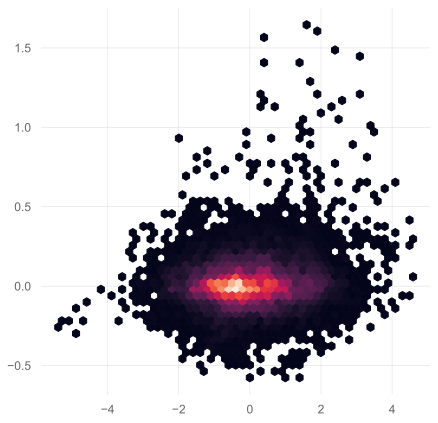

In [171]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
#import cmocean#  http://matplotlib.org/cmocean/

plt.figure(figsize=(7, 7))
ax = plt.hexbin(df["signal"], df["profit"], gridsize=50, mincnt=1) # cmocean.cm.algae is a cmocean colormap
# plt.set_title("Signal vs. Price matches")
plt.show()
# display(df)